In [35]:
#!/usr/bin/env python
# ===============================================================
#  Face-Recognition & Emotion‑Classification 
# ===============================================================
import os, time, sys
import pandas as pd
import matplotlib.pyplot as plt  # For improved visualization


In [36]:
!pip install wandb -qU


In [37]:
import os,sys
import numpy as np
import matplotlib.pyplot as plt  # For improved visualization
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset, random_split
from PIL import Image
import time
import wandb


In [38]:
# ---- Custom Dataset Class ---- #
class LimitedImageDataset(Dataset):
    def __init__(self, folder_path, label, limit, transform=None):
        self.label = label
        self.transform = transform
        self.image_paths = []
        # Recursively walk and collect image paths
        for root, _, files in os.walk(folder_path):
            for file in files:
                if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                    self.image_paths.append(os.path.join(root, file))
                    if len(self.image_paths) >= limit:
                        break
            if len(self.image_paths) >= limit:
                break
        if not self.image_paths:
            raise ValueError(f"No images found in {folder_path}")

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, self.label

In [39]:

# ---- Function to set up a model ---- #
def setup_model(model_name, pretrained=True):
    if model_name == 'vgg16':
        model = models.vgg16(pretrained=pretrained)
        
        # Freeze feature extractor if pretrained
        if pretrained:
            for param in model.features.parameters():
                param.requires_grad = False
                
        # Custom classifier head for VGG16
        model.classifier = nn.Sequential(
            nn.Linear(25088, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 2)
        )
        return model, model.classifier.parameters() if pretrained else model.parameters()
        
    elif model_name == 'resnet18':
        model = models.resnet18(pretrained=pretrained)
        
        # Freeze all layers if pretrained
        if pretrained:
            for param in model.parameters():
                param.requires_grad = False
            
            # Simple classifier head for pretrained ResNet18
            model.fc = nn.Sequential(
                nn.Linear(model.fc.in_features, 128),
                nn.ReLU(),
                nn.Linear(128, 2)
            )
            return model, model.fc.parameters()
        else:
            # Complex classifier head for non-pretrained ResNet18
            model.fc = nn.Sequential(
                nn.Linear(model.fc.in_features, 256),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(256, 64),
                nn.ReLU(),
                nn.Dropout(0.3),
                nn.Linear(64, 2)
            )
            return model, model.parameters()
    else:
        raise ValueError(f"Model {model_name} not supported")


In [40]:

# ---- Create a function to evaluate accuracy on any dataset ---- #
def evaluate_accuracy(model, data_loader, device):
    model.eval()
    correct = 0
    total = 0
    
    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    accuracy = 100 * correct / total if total > 0 else 0
    return accuracy


In [41]:
from tqdm.notebook import tqdm

# ---- Training Function ---- #
def train_model(model, train_loader, test_loader, optimizer, criterion, device, num_epochs=5, model_name='model', log_prefix='', scheduler=None):
    best_test_loss = float('inf')
    best_test_accuracy = 0.0
    
    # Lists to store epoch-wise metrics for later plotting
    train_accuracies = []
    test_accuracies = []
    
    for epoch in range(num_epochs):
        # Training phase
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        start_time = time.time()
        
        train_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Train", leave=False)
        for step, (images, labels) in enumerate(train_bar):
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            
            # Accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # Log metrics to W&B every 10 batches
            if step % 10 == 0:
                wandb.log({
                    f"{log_prefix}train_batch_loss": loss.item(),
                    f"{log_prefix}train_batch_accuracy": 100.0 * (predicted == labels).sum().item() / labels.size(0),
                    "epoch": epoch + 1
                })
            train_bar.set_postfix(loss=loss.item())
                
        # Epoch-level training metrics
        train_accuracy = 100 * correct / total
        epoch_time = time.time() - start_time
        
        # Test phase evaluation
        model.eval()
        test_loss = 0.0
        test_correct = 0
        test_total = 0
        test_bar = tqdm(test_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Test", leave=False)
        with torch.no_grad():
            for images, labels in test_bar:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                test_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                test_total += labels.size(0)
                test_correct += (predicted == labels).sum().item()
                test_bar.set_postfix(loss=loss.item())
        test_loss = test_loss / len(test_loader)
        test_accuracy = 100 * test_correct / test_total
        
        # Store accuracies for later plotting
        train_accuracies.append(train_accuracy)
        test_accuracies.append(test_accuracy)
        
        # Update best model based on lowest test loss
        if test_loss < best_test_loss:
            best_test_loss = test_loss
            best_test_accuracy = test_accuracy
            model_path = f"{model_name}_best.pth"
            torch.save(model.state_dict(), model_path)
            wandb.save(model_path)
            print(f"Saved best {model_name} model with test loss: {best_test_loss:.4f} and test accuracy: {best_test_accuracy:.2f}%")
        
        # Print metrics for this epoch
        print(f"{model_name} - Epoch [{epoch+1}/{num_epochs}], Loss: {running_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, Test Loss: {test_loss:.4f}, Test Accuracy: {test_accuracy:.2f}%, Time: {epoch_time:.2f}s")
        
        # Log epoch-level metrics to W&B
        metrics_dict = {
            "epoch": epoch + 1,
            f"{log_prefix}train_loss": running_loss / len(train_loader),
            f"{log_prefix}train_accuracy": train_accuracy,
            f"{log_prefix}test_loss": test_loss,
            f"{log_prefix}test_accuracy": test_accuracy,
            f"{log_prefix}epoch_time": epoch_time
        }
        wandb.log(metrics_dict)
        
        if scheduler is not None:
            scheduler.step()
    
    # Print the best test accuracy at the end of training
    print(f"{model_name} - Best Test Loss: {best_test_loss:.4f} and Test Accuracy: {best_test_accuracy:.2f}%")
    return model, best_test_loss, best_test_accuracy, (train_accuracies, test_accuracies)

In [42]:

# ---- Evaluation Function ---- #
def evaluate_model(model, test_dataset, device, model_name='model', log_prefix=''):
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True, num_workers=2)
    model.eval()
    correct = 0
    total = 0
    
    test_predictions = []
    test_labels = []
    
    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            # Store predictions and labels for confusion matrix
            test_predictions.extend(predicted.cpu().numpy())
            test_labels.extend(labels.cpu().numpy())
    
    accuracy = 100 * correct / total
    print(f"\n{model_name} - Test Accuracy: {accuracy:.2f}%")
    
    # Log test results to W&B with confusion matrix if available
    try:
        conf_mat = wandb.plot.confusion_matrix(
            probs=None,
            y_true=test_labels,
            preds=test_predictions,
            class_names=["Other Face", "My Face"]
        )
    except Exception as e:
        conf_mat = "Confusion matrix not available"

    wandb.log({
        f"{log_prefix}test_accuracy": accuracy,
        f"{log_prefix}conf_mat": conf_mat
    })
    
    return accuracy

In [43]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

def compute_metrics(model, dataset, device):
    model.eval()
    predictions = []
    true_labels = []
    
    loader = DataLoader(dataset, batch_size=32, shuffle=False, num_workers=2)
    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, preds = torch.max(outputs.data, 1)
            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    
    acc = accuracy_score(true_labels, predictions)
    prec = precision_score(true_labels, predictions, average='binary', pos_label=1)
    rec = recall_score(true_labels, predictions, average='binary', pos_label=1)
    f1 = f1_score(true_labels, predictions, average='binary', pos_label=1)
    
    print("Classification Report:")
    print(classification_report(true_labels, predictions, target_names=["Other Face", "My Face"]))
    
    return acc, prec, rec, f1


In [ ]:
# ---- Main  ---- #
# Initialize W&B with your API key
wandb.login()

# Initialize W&B run
wandb.init(
    project="face-recognition", 
    name="vgg16-vs-resnet18-comparison",
    config={
        "epochs": 5,
        "batch_size": 32,
        "learning_rate": 0.025,
        "optimizer": "Adam",
        "dataset": "face-recognition"
    }
)

# Update W&B config
wandb.config.update({
    "models": ["vgg16", "resnet18-pretrained", "resnet18-not-pretrained"],
    "comparison_goal": "accuracy and training time"
})


wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [45]:

data_dir = '/kaggle/input/face-data'

# ---- Set Paths and Limits ---- #
my_face_dir = os.path.join(data_dir, 'train', 'myFace')
other_face_dir = os.path.join(data_dir, 'train', 'otherFace')

test_my_face_dir = os.path.join(data_dir, 'test', 'myFace')
test_other_face_dir = os.path.join(data_dir, 'test', 'otherFace')

my_face_limit = 5000
other_face_limit = 5000
test_my_face_limit = 2000
test_other_face_limit = 2000

def letterbox(image, size=(224, 224), fill_color=(255, 255, 255)):
    iw, ih = image.size
    target_w, target_h = size
    scale = min(target_w / iw, target_h / ih)
    nw, nh = int(iw * scale), int(ih * scale)
    image_resized = image.resize((nw, nh), Image.BICUBIC)
    new_img = Image.new("RGB", size, fill_color)
    new_img.paste(image_resized, ((target_w - nw) // 2, (target_h - nh) // 2))
    return new_img


# ---- Image Transforms ---- #
transform = transforms.Compose([
    transforms.Lambda(lambda img: letterbox(img, size=(224, 224))),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Create a separate transform for validation/test without augmentations
eval_transform = transforms.Compose([
    transforms.Lambda(lambda img: letterbox(img, size=(224, 224))),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ---- Load and Combine Datasets ---- #
print("Loading datasets...")
my_face_dataset = LimitedImageDataset(my_face_dir, label=1, limit=my_face_limit, transform=transform)
print("Train My Face Samples:", len(my_face_dataset))

other_face_dataset = LimitedImageDataset(other_face_dir, label=0, limit=other_face_limit, transform=transform)
print("Train Other Face Samples:", len(other_face_dataset))

# Test dataset
test_my_face_dataset = LimitedImageDataset(test_my_face_dir, label=1, limit=test_my_face_limit, transform=eval_transform)
print("Test My Face Samples:", len(test_my_face_dataset))

test_other_face_dataset = LimitedImageDataset(test_other_face_dir, label=0, limit=test_other_face_limit, transform=eval_transform)
print("Test Other Face Samples:", len(test_other_face_dataset))

full_dataset = ConcatDataset([my_face_dataset, other_face_dataset])
test_full_dataset = ConcatDataset([test_my_face_dataset, test_other_face_dataset])

# ---- Train/Test Split and DataLoaders ---- #
train_loader = DataLoader(full_dataset, batch_size=32, shuffle=True, num_workers=2)
test_loader = DataLoader(test_full_dataset, batch_size=32, shuffle=True, num_workers=2)


Loading datasets...
Train My Face Samples: 358
Train Other Face Samples: 1379
Test My Face Samples: 88
Test Other Face Samples: 391


In [46]:
# ---- Device, Loss ---- #
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device: ", device)
criterion = nn.CrossEntropyLoss()

# ---- Train and Evaluate All Models ---- #
models_to_train = [
    {"name": "VGG16", "model_type": "vgg16", "pretrained": True, "prefix": "vgg16_"},
    {"name": "ResNet18 (Pretrained)", "model_type": "resnet18", "pretrained": True, "prefix": "resnet18_pretrained_"},
    {"name": "ResNet18 (Not Pretrained)", "model_type": "resnet18", "pretrained": False, "prefix": "resnet18_not_pretrained_"}
]

results = {}
all_accuracies = {}

# Create wandb plots for epoch vs accuracy
for model_config in models_to_train:
    prefix = model_config["prefix"]
    wandb.define_metric(f"{prefix}train_accuracy", step_metric="epoch")
    wandb.define_metric(f"{prefix}test_accuracy", step_metric="epoch")

for model_config in models_to_train:
    print(f"\n=== Training {model_config['name']} ===")
    model, trainable_params = setup_model(model_config["model_type"], model_config["pretrained"])
    model = model.to(device)
    
    # Watch model with W&B
    wandb.watch(model, criterion, log="all", log_freq=10, log_graph=True)
    
    # Create optimizer for trainable parameters
    optimizer = optim.Adam(trainable_params, lr=0.025)
    
    # Create scheduler
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.95)
    
    # Train the model
    start_time = time.time()
    model, best_test_loss, best_test_acc, accuracies = train_model(
        model, train_loader, test_loader,
        optimizer, criterion, device, 
        num_epochs=wandb.config.epochs, model_name=model_config["name"], 
        log_prefix=model_config["prefix"], scheduler=scheduler
    )
    training_time = time.time() - start_time
    
    # Store accuracies for comparison plot
    all_accuracies[model_config["name"]] = accuracies
    
    # Evaluate the model
    test_acc = evaluate_model(
        model, test_full_dataset, device, 
        model_name=model_config["name"], 
        log_prefix=model_config["prefix"]
    )
    
    # Call compute_metrics to calculate additional metrics on test data
    acc, prec, rec, f1 = compute_metrics(model, test_full_dataset, device)
    
    # Store results
    results[model_config["name"]] = {
        "test_loss": best_test_loss,
        "test_accuracy": test_acc,
        "best_test_accuracy": best_test_acc,
        "training_time": training_time,
        "final_accuracy": acc,
        "precision": prec,
        "recall": rec,
        "f1_score": f1
    }
    
    # Log summary statistics
    wandb.run.summary[f"{model_config['prefix']}best_test_loss"] = best_test_loss
    wandb.run.summary[f"{model_config['prefix']}test_accuracy"] = test_acc
    wandb.run.summary[f"{model_config['prefix']}best_test_accuracy"] = best_test_acc
    wandb.run.summary[f"{model_config['prefix']}training_time"] = training_time
    wandb.run.summary[f"{model_config['prefix']}final_accuracy"] = acc
    wandb.run.summary[f"{model_config['prefix']}precision"] = prec
    wandb.run.summary[f"{model_config['prefix']}recall"] = rec
    wandb.run.summary[f"{model_config['prefix']}f1_score"] = f1


Device:  cuda

=== Training VGG16 ===


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
wandb: logging graph, to disable use `wandb.watch(log_graph=False)`


Epoch 1/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 1/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best VGG16 model with test loss: 0.4467 and test accuracy: 99.37%
VGG16 - Epoch [1/5], Loss: 962.9035, Train Accuracy: 90.73%, Test Loss: 0.4467, Test Accuracy: 99.37%, Time: 8.85s


Epoch 2/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 2/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

VGG16 - Epoch [2/5], Loss: 127.7829, Train Accuracy: 97.87%, Test Loss: 0.5595, Test Accuracy: 99.58%, Time: 8.91s


Epoch 3/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 3/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best VGG16 model with test loss: 0.1342 and test accuracy: 99.79%
VGG16 - Epoch [3/5], Loss: 195.8171, Train Accuracy: 97.58%, Test Loss: 0.1342, Test Accuracy: 99.79%, Time: 8.65s


Epoch 4/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 4/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best VGG16 model with test loss: 0.1330 and test accuracy: 99.58%
VGG16 - Epoch [4/5], Loss: 105.0065, Train Accuracy: 98.27%, Test Loss: 0.1330, Test Accuracy: 99.58%, Time: 9.09s


Epoch 5/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 5/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

VGG16 - Epoch [5/5], Loss: 237.5065, Train Accuracy: 97.58%, Test Loss: 0.4338, Test Accuracy: 99.58%, Time: 9.08s
VGG16 - Best Test Loss: 0.1330 and Test Accuracy: 99.58%

VGG16 - Test Accuracy: 99.58%
Classification Report:
              precision    recall  f1-score   support

  Other Face       0.99      1.00      1.00       391
     My Face       1.00      0.98      0.99        88

    accuracy                           1.00       479
   macro avg       1.00      0.99      0.99       479
weighted avg       1.00      1.00      1.00       479


=== Training ResNet18 (Pretrained) ===


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
wandb: logging graph, to disable use `wandb.watch(log_graph=False)`


Epoch 1/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 1/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best ResNet18 (Pretrained) model with test loss: 0.0621 and test accuracy: 96.66%
ResNet18 (Pretrained) - Epoch [1/5], Loss: 25.7661, Train Accuracy: 89.52%, Test Loss: 0.0621, Test Accuracy: 96.66%, Time: 7.13s


Epoch 2/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 2/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best ResNet18 (Pretrained) model with test loss: 0.0434 and test accuracy: 97.91%
ResNet18 (Pretrained) - Epoch [2/5], Loss: 5.2017, Train Accuracy: 97.01%, Test Loss: 0.0434, Test Accuracy: 97.91%, Time: 7.62s


Epoch 3/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 3/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

ResNet18 (Pretrained) - Epoch [3/5], Loss: 8.9326, Train Accuracy: 94.53%, Test Loss: 0.0870, Test Accuracy: 96.03%, Time: 7.25s


Epoch 4/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 4/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

ResNet18 (Pretrained) - Epoch [4/5], Loss: 5.5048, Train Accuracy: 96.49%, Test Loss: 0.0535, Test Accuracy: 98.12%, Time: 7.23s


Epoch 5/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 5/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

ResNet18 (Pretrained) - Epoch [5/5], Loss: 4.5008, Train Accuracy: 97.01%, Test Loss: 0.0832, Test Accuracy: 97.49%, Time: 7.29s
ResNet18 (Pretrained) - Best Test Loss: 0.0434 and Test Accuracy: 97.91%

ResNet18 (Pretrained) - Test Accuracy: 97.49%
Classification Report:
              precision    recall  f1-score   support

  Other Face       1.00      0.97      0.98       391
     My Face       0.88      1.00      0.94        88

    accuracy                           0.97       479
   macro avg       0.94      0.98      0.96       479
weighted avg       0.98      0.97      0.98       479


=== Training ResNet18 (Not Pretrained) ===


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
wandb: logging graph, to disable use `wandb.watch(log_graph=False)`


Epoch 1/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 1/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best ResNet18 (Not Pretrained) model with test loss: 0.4501 and test accuracy: 81.63%
ResNet18 (Not Pretrained) - Epoch [1/5], Loss: 52.5875, Train Accuracy: 75.99%, Test Loss: 0.4501, Test Accuracy: 81.63%, Time: 7.80s


Epoch 2/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 2/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best ResNet18 (Not Pretrained) model with test loss: 0.3573 and test accuracy: 89.77%
ResNet18 (Not Pretrained) - Epoch [2/5], Loss: 25.3797, Train Accuracy: 81.29%, Test Loss: 0.3573, Test Accuracy: 89.77%, Time: 7.68s


Epoch 3/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 3/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best ResNet18 (Not Pretrained) model with test loss: 0.2770 and test accuracy: 89.77%
ResNet18 (Not Pretrained) - Epoch [3/5], Loss: 17.6037, Train Accuracy: 88.03%, Test Loss: 0.2770, Test Accuracy: 89.77%, Time: 7.78s


Epoch 4/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 4/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

Saved best ResNet18 (Not Pretrained) model with test loss: 0.1916 and test accuracy: 93.74%
ResNet18 (Not Pretrained) - Epoch [4/5], Loss: 15.8836, Train Accuracy: 90.04%, Test Loss: 0.1916, Test Accuracy: 93.74%, Time: 8.26s


Epoch 5/5 - Train:   0%|          | 0/55 [00:00<?, ?it/s]

Epoch 5/5 - Test:   0%|          | 0/15 [00:00<?, ?it/s]

ResNet18 (Not Pretrained) - Epoch [5/5], Loss: 11.1167, Train Accuracy: 93.61%, Test Loss: 0.2169, Test Accuracy: 91.86%, Time: 7.84s
ResNet18 (Not Pretrained) - Best Test Loss: 0.1916 and Test Accuracy: 93.74%

ResNet18 (Not Pretrained) - Test Accuracy: 91.86%
Classification Report:
              precision    recall  f1-score   support

  Other Face       0.91      0.99      0.95       391
     My Face       0.96      0.58      0.72        88

    accuracy                           0.92       479
   macro avg       0.94      0.79      0.84       479
weighted avg       0.92      0.92      0.91       479



In [47]:

# Create comparison table
comparison_data = []
for model_name, metrics in results.items():
    comparison_data.append([
        model_name, 
        f"{metrics['test_loss']:.4f}", 
        f"{metrics['best_test_accuracy']:.2f}%",
        f"{metrics['training_time']:.2f}s"
    ])

comparison_table = wandb.Table(
data=comparison_data,
columns=["Model", "Best Test Loss", "Best Test Accuracy", "Training Time"]
)

wandb.log({"model_comparison": comparison_table})

# Create custom charts for epoch vs accuracy - FIXED to avoid using 'groupby' parameter
epochs = list(range(1, wandb.config.epochs + 1))

# Plot test accuracy comparison using separate lines for each model
for model in models_to_train:
    model_name = model["name"]
    model_test_accuracies = all_accuracies[model_name][1]  # Index 1 for test accuracies
    
    for i, epoch in enumerate(epochs):
        wandb.log({
            "epoch": epoch,
            f"{model_name}_test_accuracy": model_test_accuracies[i]
        })

# Plot training accuracy comparison
for model in models_to_train:
    model_name = model["name"]
    model_train_accuracies = all_accuracies[model_name][0]  # Index 0 for training accuracies
    
    for i, epoch in enumerate(epochs):
        wandb.log({
            "epoch": epoch,
            f"{model_name}_train_accuracy": model_train_accuracies[i]
        })

# Print final comparison
print("\n=== Model Comparison ===")
print(f"{'Model':25} | {'Test Loss':15}  | {'Best Test Acc':15} | {'Training Time':15}")
print("-" * 100)
for model_name, metrics in results.items():
    print(f"{model_name:25} | {metrics['test_loss']:15.4f} | {metrics['best_test_accuracy']:15.2f}% | {metrics['training_time']:15.2f}s")

# Print highest test accuracy achieved across all models (added as requested)
highest_test_accuracy = max([metrics["best_test_accuracy"] for metrics in results.values()])
best_model = max(results.items(), key=lambda x: x[1]["best_test_accuracy"])[0]
print(f"\n=== HIGHEST TEST ACCURACY ACHIEVED ===")
print(f"Model: {best_model}")
print(f"Accuracy: {highest_test_accuracy:.2f}%")




=== Model Comparison ===
Model                     | Test Loss        | Best Test Acc   | Training Time  
----------------------------------------------------------------------------------------------------
VGG16                     |          0.1330 |           99.58% |           56.79s
ResNet18 (Pretrained)     |          0.0434 |           97.91% |           42.51s
ResNet18 (Not Pretrained) |          0.1916 |           93.74% |           45.80s

=== HIGHEST TEST ACCURACY ACHIEVED ===
Model: VGG16
Accuracy: 99.58%


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_31/549657154.py:46: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In

Found images: ['yashc_test_45.jpg', 'otherFace_test_84.jpg', 'yashc_test_17.jpg', 'yashc_test_63.jpg', 'otherFace_test_56.jpg', 'otherFace_test_125.jpg', 'otherFace_test_149.jpg', 'yashc_test_70.jpg', 'otherFace_test_73.jpg', 'otherFace_test_166.jpg', 'yashc_test_33.jpg', 'otherFace_test_370.jpg', 'yashc_test_55.jpg', 'yashc_test_84.jpg', 'otherFace_test_32.jpg', 'otherFace_test_6.jpg']
Simulating for VGG16...


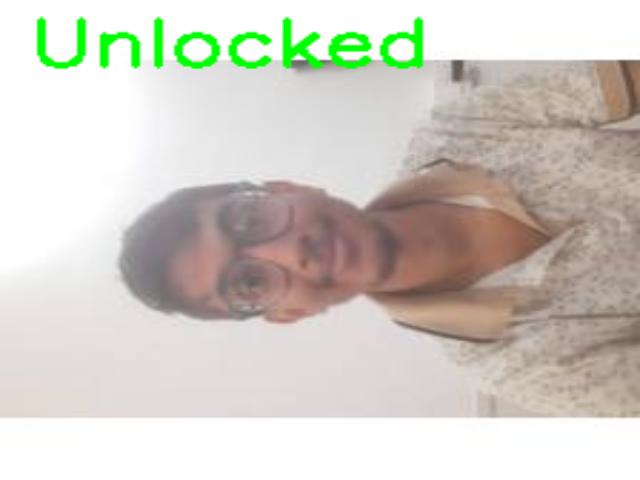

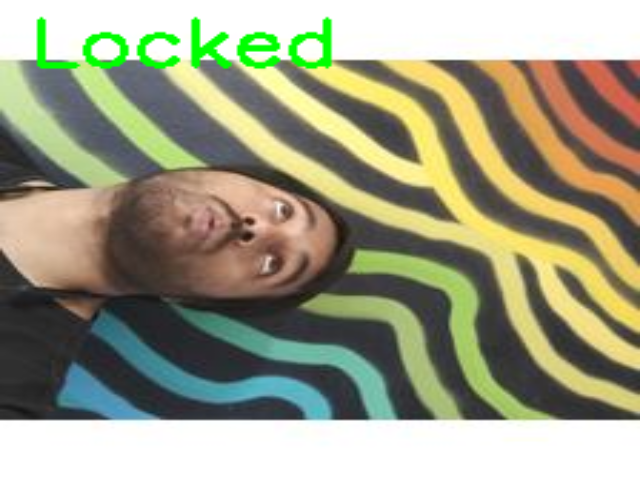

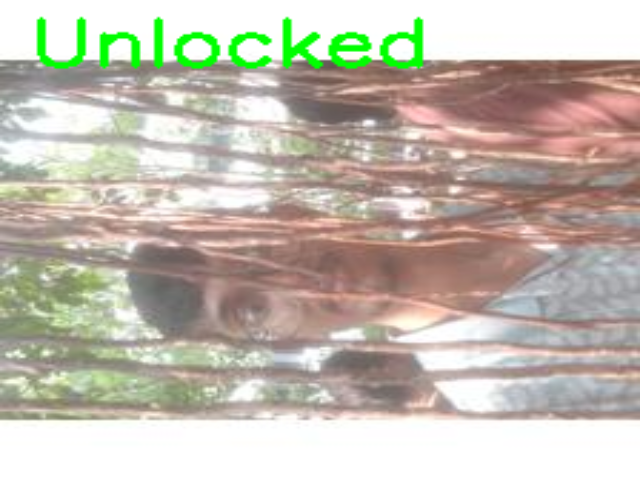

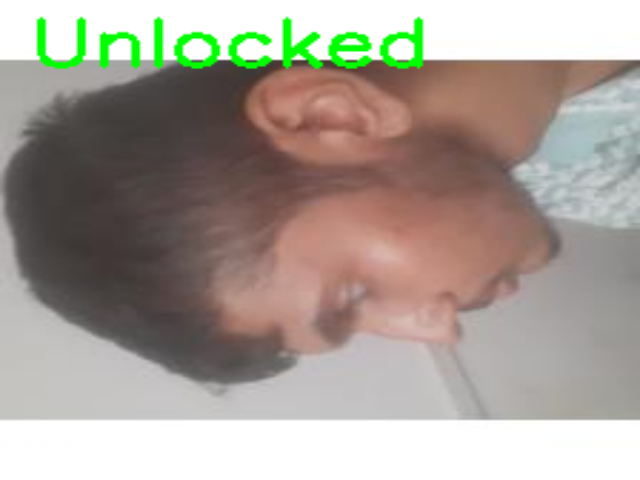

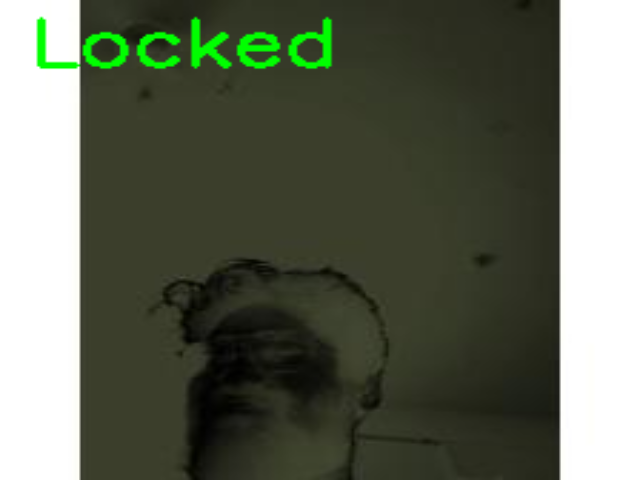

...

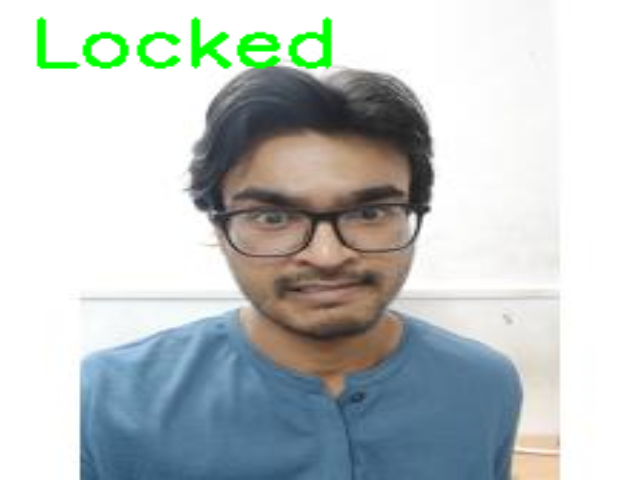

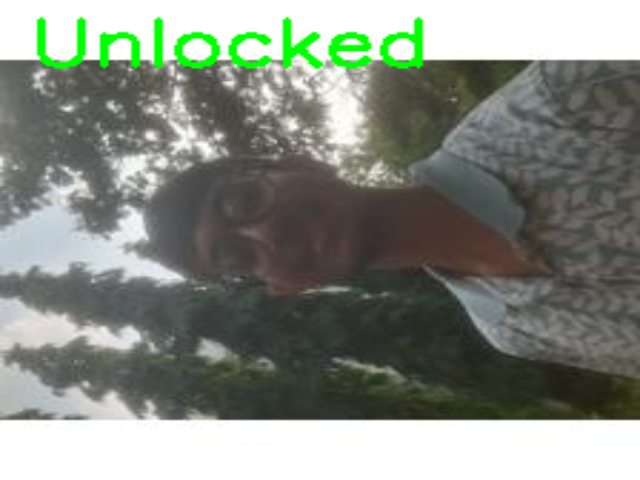

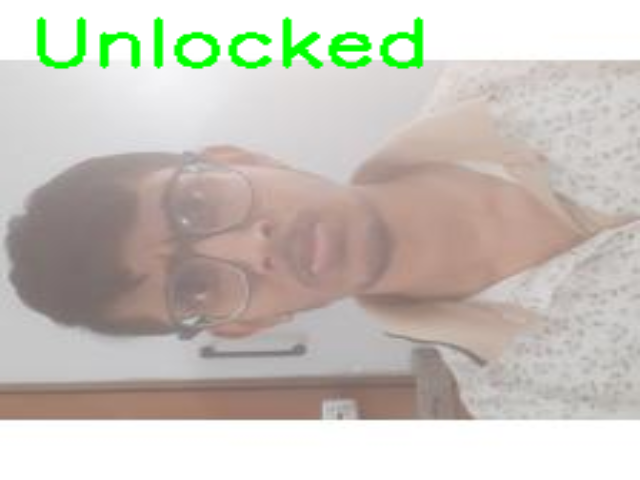

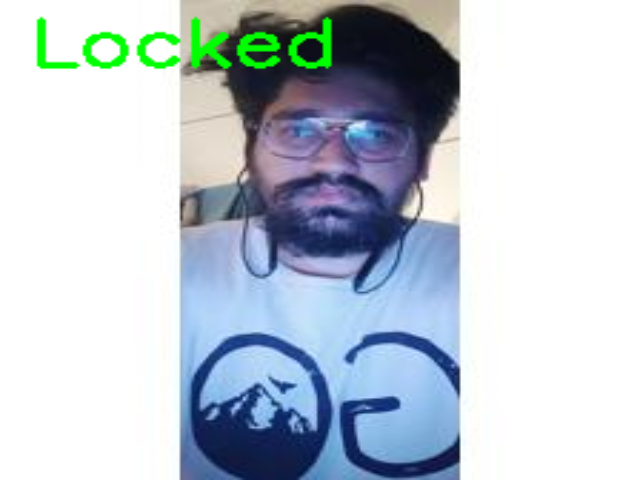

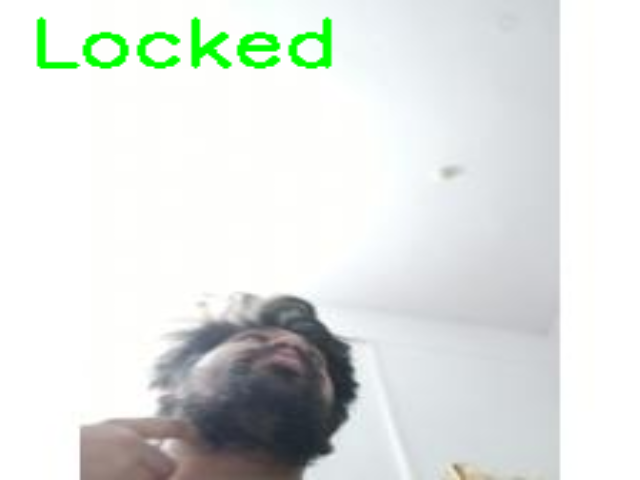

MP4 video saved as simulation_VGG16.mp4
Simulating for ResNet18_Pretrained...


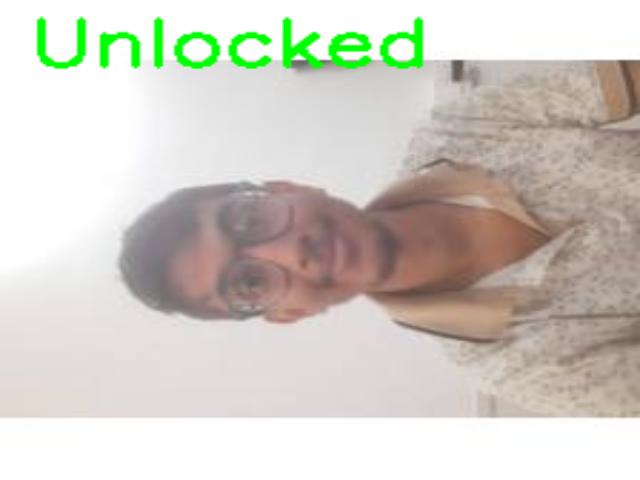

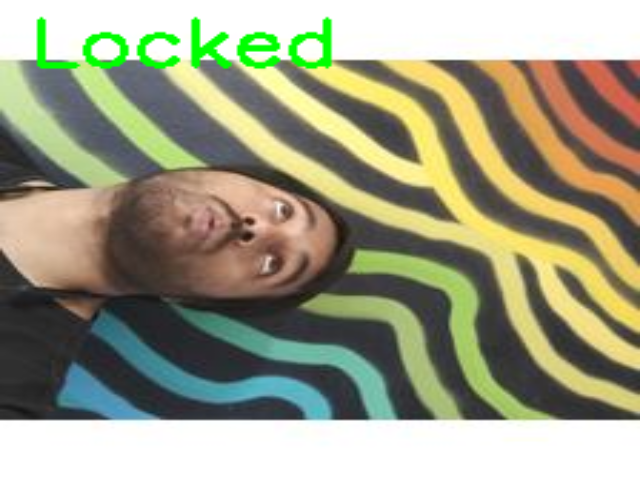

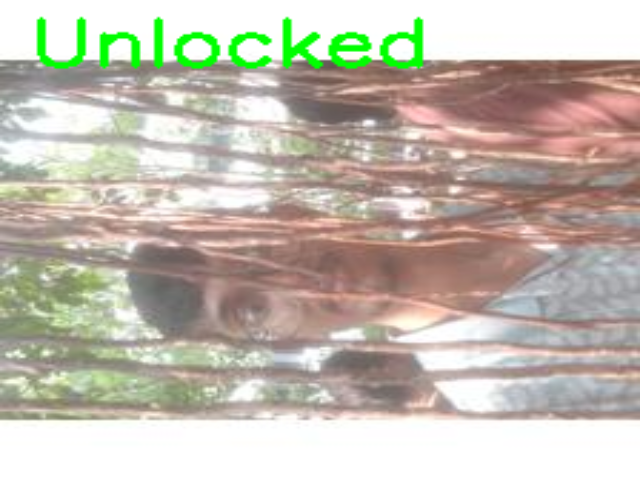

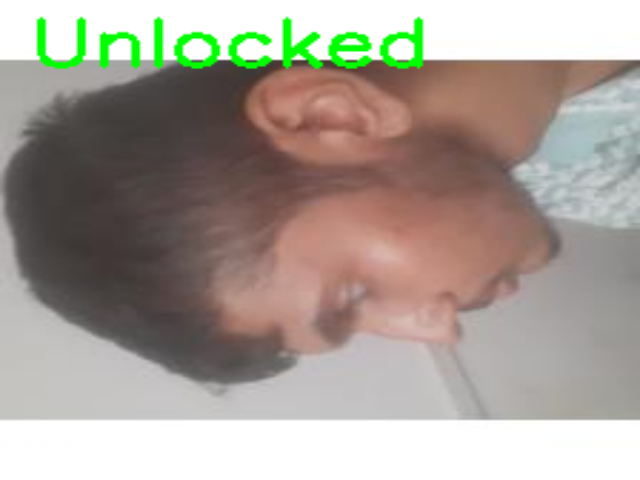

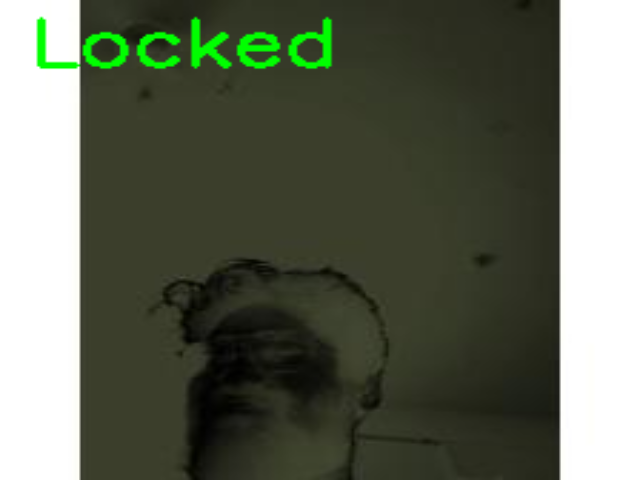

...

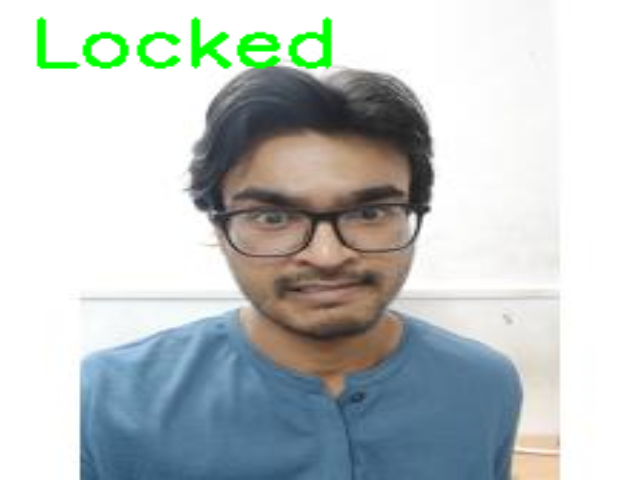

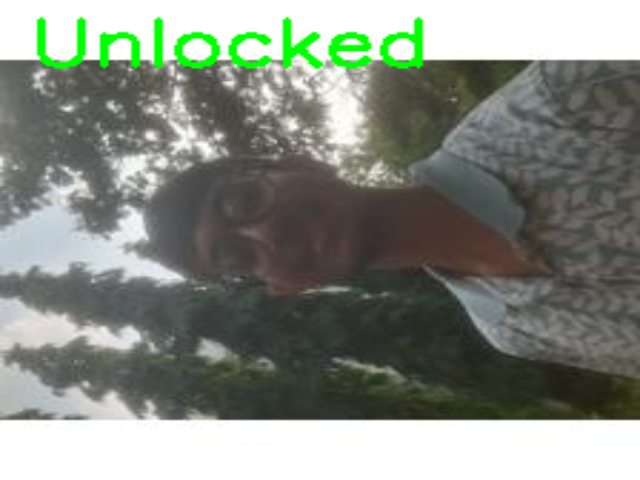

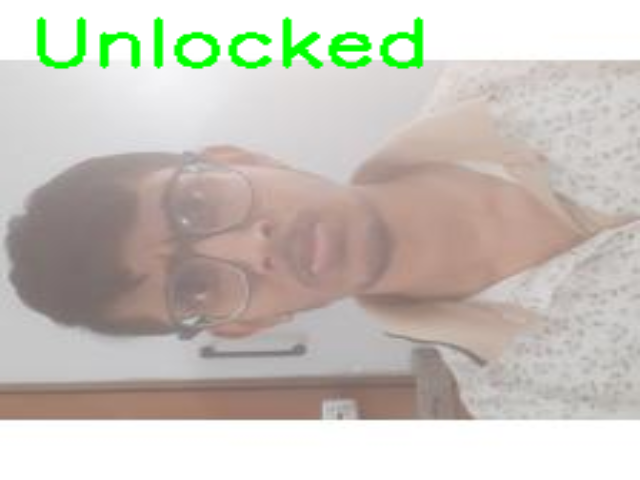

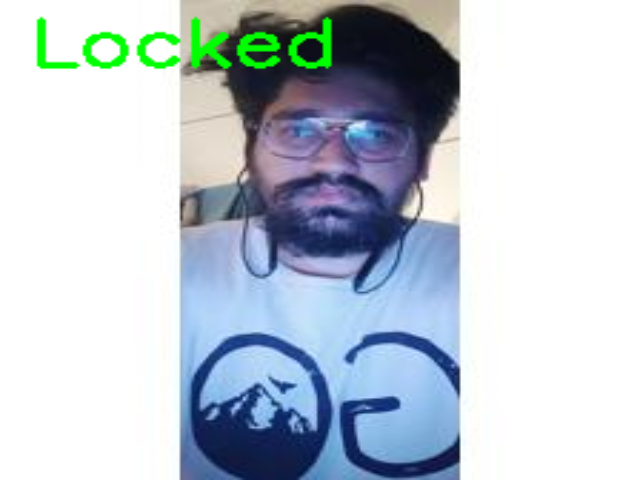

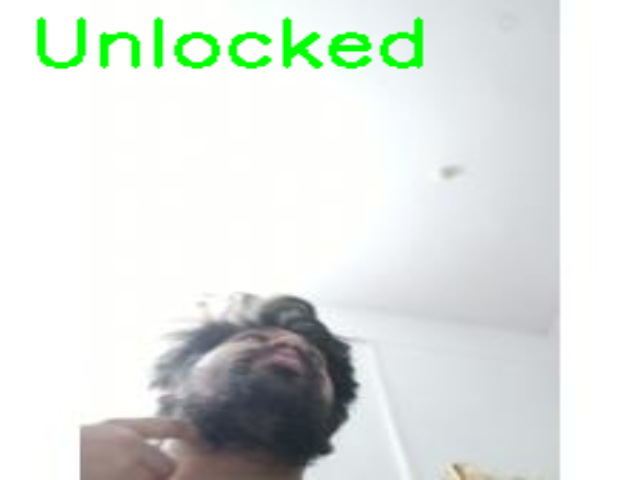

MP4 video saved as simulation_ResNet18_Pretrained.mp4
Simulating for ResNet18_NotPretrained...


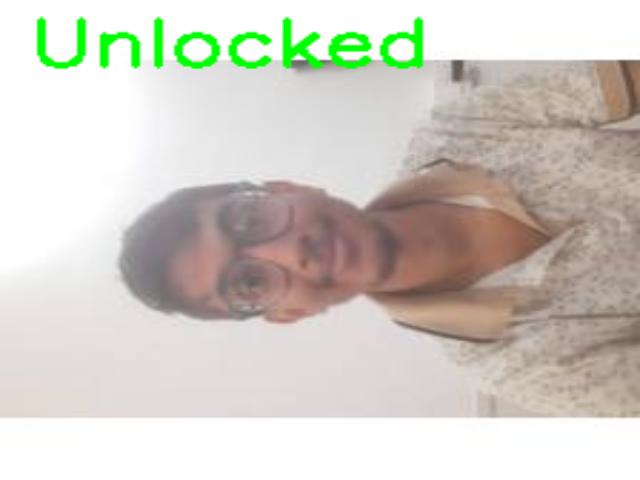

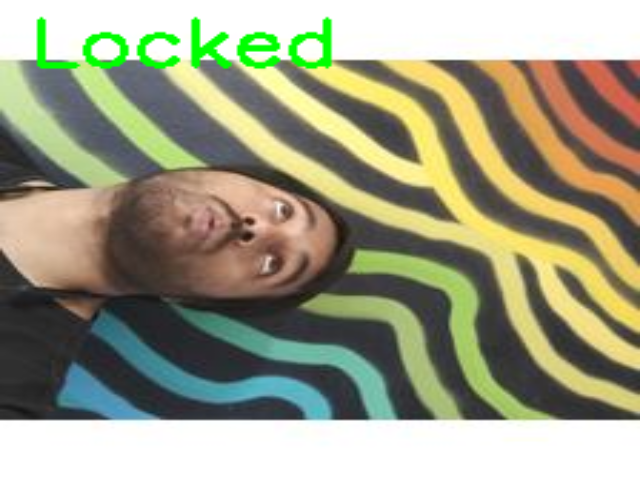

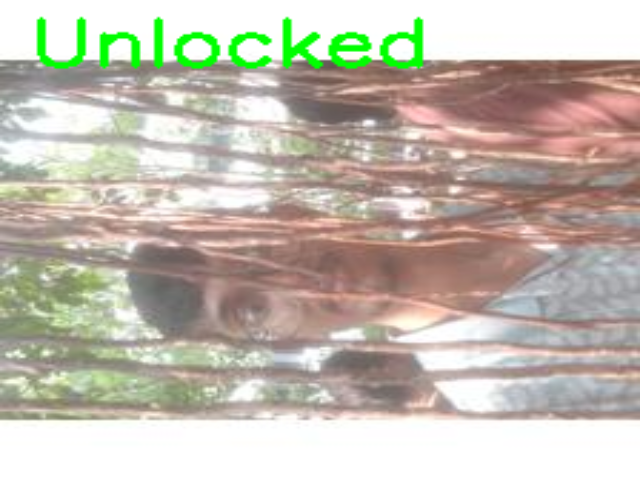

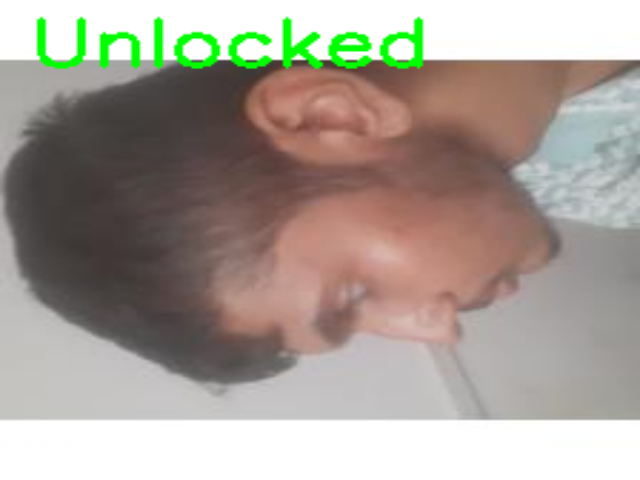

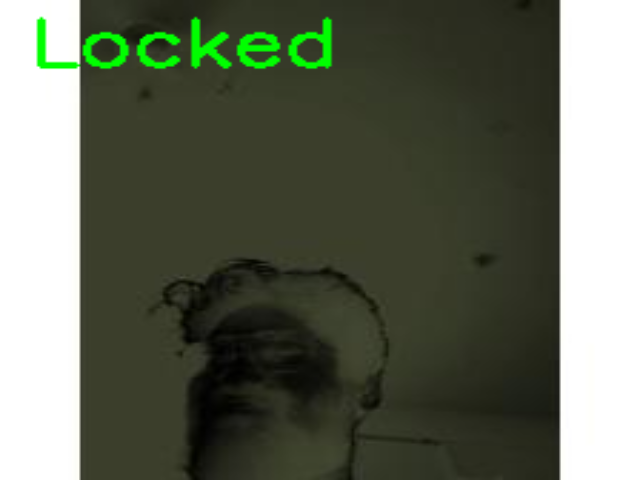

...

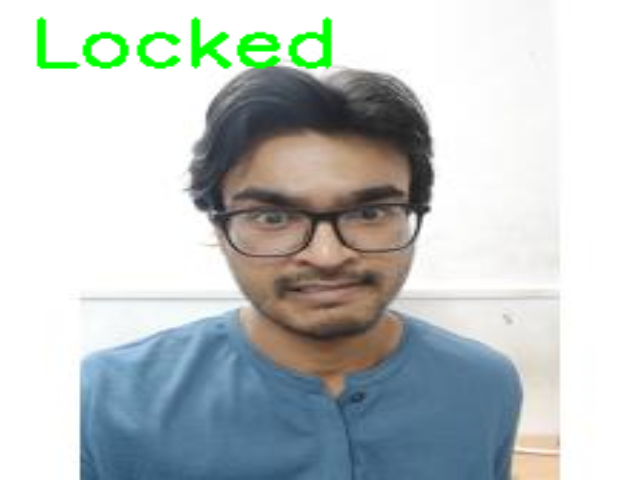

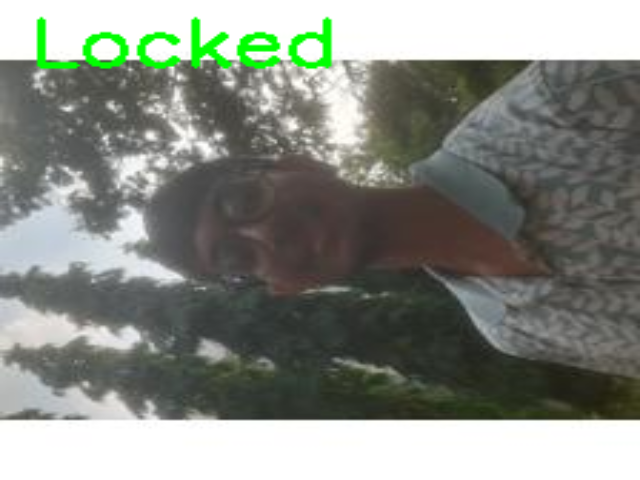

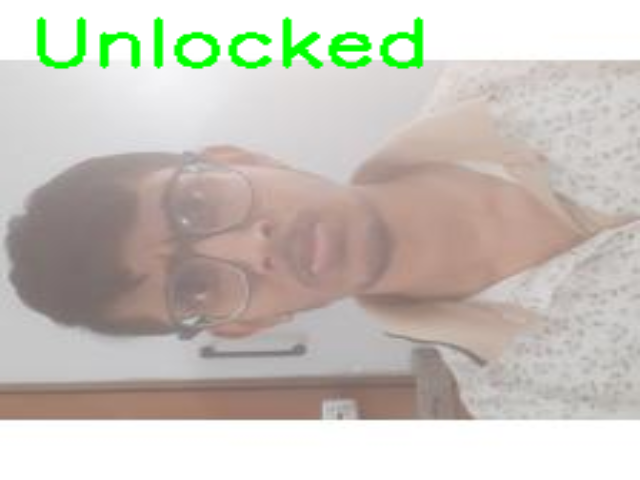

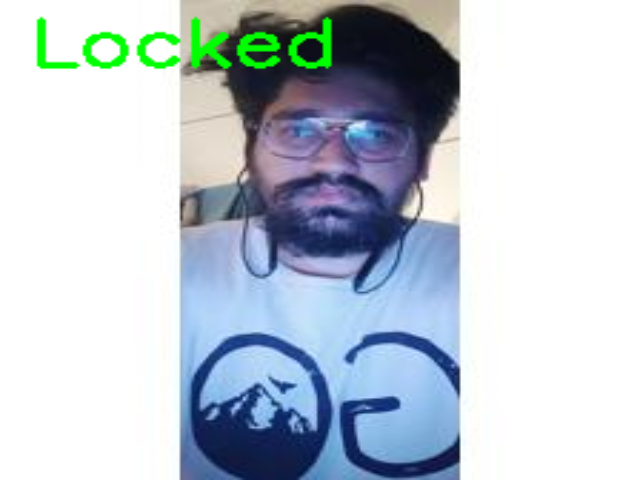

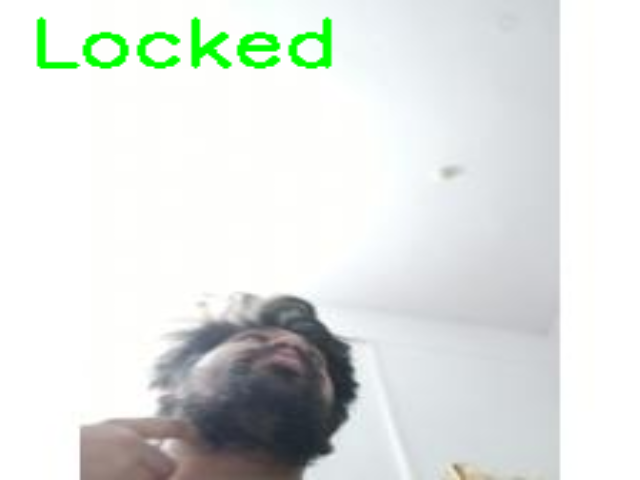

MP4 video saved as simulation_ResNet18_NotPretrained.mp4


ResNet18 (Not Pretrained)_test_accuracy,▁▆▆█▇
ResNet18 (Not Pretrained)_train_accuracy,▁▃▆▇█
ResNet18 (Pretrained)_test_accuracy,▃▇▁█▆
ResNet18 (Pretrained)_train_accuracy,▁█▆██
VGG16_test_accuracy,▁▅█▅▅
VGG16_train_accuracy,▁█▇█▇
epoch,▁▁▁▁▁▃▅▅▅▆▆████▁▁▃▅▅▆████▅▅▅▆▆▆███▃█▃▅▅▃
resnet18_not_pretrained_epoch_time,▂▁▂█▃
resnet18_not_pretrained_test_accuracy,▁▆▆█▇▇
resnet18_not_pretrained_test_loss,█▅▃▁▂
resnet18_not_pretrained_train_accuracy,▁▃▆▇█


In [48]:
# --- Simulation for All Three Models --- #
import cv2
import os
import torch
from torchvision import transforms, models
from PIL import Image as PILImage
from IPython.display import display
import io
import wandb

# Set device (reuses value from previous cell if already defined)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Ensure that model_configs is defined (it should be defined in a previous cell)
if 'model_configs' not in globals():
    model_configs = {
        'VGG16': {
            'builder': lambda: setup_model('vgg16', True)[0],
            'configure': lambda m: None,
            'weight_path': 'VGG16_best.pth'
        },
        'ResNet18_Pretrained': {
            'builder': lambda: setup_model('resnet18', True)[0],
            'configure': lambda m: None,
            'weight_path': 'ResNet18 (Pretrained)_best.pth'
        },
        'ResNet18_NotPretrained': {
            'builder': lambda: setup_model('resnet18', False)[0],
            'configure': lambda m: None,
            'weight_path': 'ResNet18 (Not Pretrained)_best.pth'
        }
    }

# Define simulation transform (reuse existing 'sim_transform' if desired)
sim_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Configure models using the model_configs dict
models_dict = {}
for name, cfg in model_configs.items():
    m = cfg["builder"]()
    cfg["configure"](m)
    m.load_state_dict(torch.load(cfg["weight_path"], map_location=device))
    m = m.to(device)
    m.eval()
    models_dict[name] = m

# Simulation: Process test images and generate simulation videos (MP4) for each model
test_images_folder = '/kaggle/input/test-images'  # adjust path if needed
image_files = [f for f in os.listdir(test_images_folder) if f.lower().endswith(('.jpg','.jpeg','.png'))]
print("Found images:", image_files)

frame_width, frame_height = 640, 480

for model_name, model in models_dict.items():
    mp4_output = f"simulation_{model_name.replace(' ', '_')}.mp4"
    print(f"Simulating for {model_name}...")
    
    # Create video writer for MP4 video (2 fps)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video_writer = cv2.VideoWriter(mp4_output, fourcc, 2, (frame_width, frame_height))
    
    for img_file in image_files:
        img_path = os.path.join(test_images_folder, img_file)
        image = cv2.imread(img_path)
        if image is None:
            continue
        # Convert for processing with PIL and transform
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        pil_image = PILImage.fromarray(image_rgb)
        input_tensor = sim_transform(pil_image).unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(input_tensor)
            _, pred = torch.max(output, 1)
            pred = pred.item()
        status = "Unlocked" if pred == 1 else "Locked"
        # Put the status text on the original image (BGR)
        cv2.putText(image, status, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
        
        # Resize frame for output
        resized = cv2.resize(image, (frame_width, frame_height))
        
        # Write frame to mp4 video (expects BGR format)
        video_writer.write(resized)
        
        # Only display the simulation pictures
        display(PILImage.fromarray(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)))
    
    # Release the video writer to finalize the mp4 file
    video_writer.release()
    print(f"MP4 video saved as {mp4_output}")
    
    # Log the video to wandb
    wandb.save(mp4_output)

# Close the W&B run if needed
wandb.finish()
